# Homework1, part 1. EEG analysis (7 pt)

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/drive/1yhN0xHweL8FkqTNzxk-BYYL4yt9gKA_m?usp=sharing)

**Plan**

1. Read and visualize the data (**2 pt**)
2. Preprocess the data (**1 pt**)
3. Use ICA for noise reduction (**2 pt**)
4. Compute ERP, plot topomaps for ERP, and analyze (**2 pt**)

This part of the homework is based on the [seminar 1](https://bimai-lab.github.io/NEUROML_course/seminar1/seminar1_working_with_eeg_ipynb_.html).

**If the notebook is hard to read, we will subtract 2 points. If the notebook is not reproducible (the random seed is not fixed) and/or runs with errors, this part of the homework will be scored with 0 points.**

In [1]:
# For Colab only
# !pip install mne
# !pip install mne-connectivity

In [2]:
import warnings
warnings.filterwarnings('ignore')
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib

In [3]:
# not in colab
%matplotlib notebook
# in colab
# %matplotlib inline

We will work with data for one patient from [EEG Motor Movement/Imagery Dataset](https://www.physionet.org/content/eegmmidb/1.0.0/).

In [4]:
# !wget "https://www.physionet.org/files/eegmmidb/1.0.0/S010/S010R03.edf"

In [5]:
# !ls

## 1. Read and visualize the data (2 pt)

### 1.1 Read the data `S010R03.edf` and get info (0.5 pt)

In [6]:
# YOUR CODE HERE
sample = mne.io.read_raw_edf('S010R03.edf', verbose=False, preload=True)
sample.info

Measurement date,"August 12, 2009 16:15:00 GMT"
Experimenter,Unknown
Participant,X
Digitized points,Not available
Good channels,64 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,160.00 Hz
Highpass,0.00 Hz
Lowpass,80.00 Hz


### 1.2 Calculate the sampling frequency and length (0.25 pt)

In [7]:
# YOUR CODE HERE
print('Frequency:', sample.info['sfreq'])
t = len(sample) / sample.info['sfreq']
print(f'Time: {t} sec')

Frequency: 160.0
Time: 123.0 sec


### 1.3 Set the best montage for the data (1 pt)

The EEGs in the data were recorded from 64 electrodes according to the international 10-10 system. Find the montage from `mne.channels.get_builtin_montages(descriptions=True)` with 10-10 electrode names. Correct the channel names using `sample.rename_channels(map)` and `pick` only those channels that the montage has. Apply the montage to the raw data using `set_montage`.  You should obtain the montage with 62 channels. 

In [8]:
# YOUR CODE HERE
mne.channels.get_builtin_montages(descriptions=True)

[('standard_1005',
  'Electrodes are named and positioned according to the international 10-05 system (343+3 locations)'),
 ('standard_1020',
  'Electrodes are named and positioned according to the international 10-20 system (94+3 locations)'),
 ('standard_alphabetic',
  'Electrodes are named with LETTER-NUMBER combinations (A1, B2, F4, …) (65+3 locations)'),
 ('standard_postfixed',
  'Electrodes are named according to the international 10-20 system using postfixes for intermediate positions (100+3 locations)'),
 ('standard_prefixed',
  'Electrodes are named according to the international 10-20 system using prefixes for intermediate positions (74+3 locations)'),
 ('standard_primed',
  "Electrodes are named according to the international 10-20 system using prime marks (' and '') for intermediate positions (100+3 locations)"),
 ('biosemi16', 'BioSemi cap with 16 electrodes (16+3 locations)'),
 ('biosemi32', 'BioSemi cap with 32 electrodes (32+3 locations)'),
 ('biosemi64', 'BioSemi cap w

In [9]:
ten_ten_montage = mne.channels.make_standard_montage('brainproducts-RNP-BA-128')
print(len(ten_ten_montage.ch_names), 'channels in montage')
print(ten_ten_montage.ch_names)

130 channels in montage
['Fp1', 'Fz', 'F3', 'F7', 'F9', 'FC5', 'FC1', 'C3', 'T7', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'P9', 'O1', 'Oz', 'O2', 'P10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'C4', 'Cz', 'FC2', 'FC6', 'F10', 'F8', 'F4', 'Fp2', 'AF7', 'AF3', 'AFz', 'F1', 'F5', 'FT7', 'FC3', 'C1', 'C5', 'TP7', 'CP3', 'P1', 'P5', 'PO7', 'PO3', 'Iz', 'POz', 'PO4', 'PO8', 'P6', 'P2', 'CPz', 'CP4', 'TP8', 'C6', 'C2', 'FC4', 'FT8', 'F6', 'F2', 'AF4', 'AF8', 'AFF3h', 'FFC1h', 'FFC5h', 'FT9', 'FTT7h', 'FCC3h', 'CCP1h', 'CCP5h', 'TP9', 'TPP7h', 'CPP3h', 'PPO3h', 'PPO9h', 'POO1', 'PO9', 'I1', 'I2', 'PO10', 'POO2', 'PPO10h', 'PPO4h', 'CPP4h', 'TPP8h', 'TP10', 'CCP6h', 'CCP2h', 'FCC4h', 'FTT8h', 'FT10', 'FFC6h', 'FFC2h', 'AFF4h', 'AFp1', 'AFF1h', 'AFF5h', 'FFT7h', 'FFC3h', 'FCC1h', 'FCC5h', 'TTP7h', 'CCP3h', 'CPP1h', 'CPP5h', 'TPP9h', 'PPO5h', 'PPO1h', 'POO9h', 'OI1h', 'OI2h', 'POO10h', 'PPO2h', 'PPO6h', 'TPP10h', 'CPP6h', 'CPP2h', 'CCP4h', 'TTP8h', 'FCC6h', 'FCC2h', 'FFC4h', 'FFT8h', 'AFF6h', 'AFF2h', 'AFp2', 'F

In [10]:
print(sample.ch_names)

['Fc5.', 'Fc3.', 'Fc1.', 'Fcz.', 'Fc2.', 'Fc4.', 'Fc6.', 'C5..', 'C3..', 'C1..', 'Cz..', 'C2..', 'C4..', 'C6..', 'Cp5.', 'Cp3.', 'Cp1.', 'Cpz.', 'Cp2.', 'Cp4.', 'Cp6.', 'Fp1.', 'Fpz.', 'Fp2.', 'Af7.', 'Af3.', 'Afz.', 'Af4.', 'Af8.', 'F7..', 'F5..', 'F3..', 'F1..', 'Fz..', 'F2..', 'F4..', 'F6..', 'F8..', 'Ft7.', 'Ft8.', 'T7..', 'T8..', 'T9..', 'T10.', 'Tp7.', 'Tp8.', 'P7..', 'P5..', 'P3..', 'P1..', 'Pz..', 'P2..', 'P4..', 'P6..', 'P8..', 'Po7.', 'Po3.', 'Poz.', 'Po4.', 'Po8.', 'O1..', 'Oz..', 'O2..', 'Iz..']


We need to delete dots and set all letters in upper case excluding 'Fp\*', '\*z'.

In [11]:
map = {}
for ch in sample.ch_names:
    map[ch] = ch.replace(".", "")
sample.rename_channels(map);

In [12]:
map = {}
for ch in sample.ch_names:
    if 'Fp' in ch:
        map[ch] = ch
    elif 'z' not in ch:
        map[ch] = ch.upper()
    else:
        map[ch] = ch[:-1].upper()+'z'
sample.rename_channels(map);

In [13]:
print(sample.ch_names)

['FC5', 'FC3', 'FC1', 'FCz', 'FC2', 'FC4', 'FC6', 'C5', 'C3', 'C1', 'Cz', 'C2', 'C4', 'C6', 'CP5', 'CP3', 'CP1', 'CPz', 'CP2', 'CP4', 'CP6', 'Fp1', 'Fpz', 'Fp2', 'AF7', 'AF3', 'AFz', 'AF4', 'AF8', 'F7', 'F5', 'F3', 'F1', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT7', 'FT8', 'T7', 'T8', 'T9', 'T10', 'TP7', 'TP8', 'P7', 'P5', 'P3', 'P1', 'Pz', 'P2', 'P4', 'P6', 'P8', 'PO7', 'PO3', 'POz', 'PO4', 'PO8', 'O1', 'Oz', 'O2', 'Iz']


In [14]:
# List of channels excluding 'T10', 'T9'
ch_to_use = ['FC5', 'FC3', 'FC1', 'FCz', 'FC2', 'FC4', 'FC6', 'C5', 'C3', 'C1', 'Cz', 'C2', 
             'C4', 'C6', 'CP5', 'CP3', 'CP1', 'CPz', 'CP2', 'CP4', 'CP6', 'Fp1', 'Fpz', 
             'Fp2', 'AF7', 'AF3', 'AFz', 'AF4', 'AF8', 'F7', 'F5', 'F3', 'F1', 'Fz', 'F2', 
             'F4', 'F6', 'F8', 'FT7', 'FT8', 'T7', 'T8', 'TP7', 'TP8', 'P7', 'P5', 'P3', 'P1', 
             'Pz', 'P2', 'P4', 'P6', 'P8', 'PO7', 'PO3', 'POz', 'PO4', 
             'PO8', 'O1', 'Oz', 'O2', 'Iz']
sample_1010 = sample.copy().pick(ch_to_use)

# check that everything is OK
assert len(ch_to_use) == len(sample_1010.ch_names)

In [15]:
sample_1010.set_montage(ten_ten_montage);

### 1.4 Plot sensors and PSD of the signal (0.25 pt)

<IPython.core.display.Javascript object>


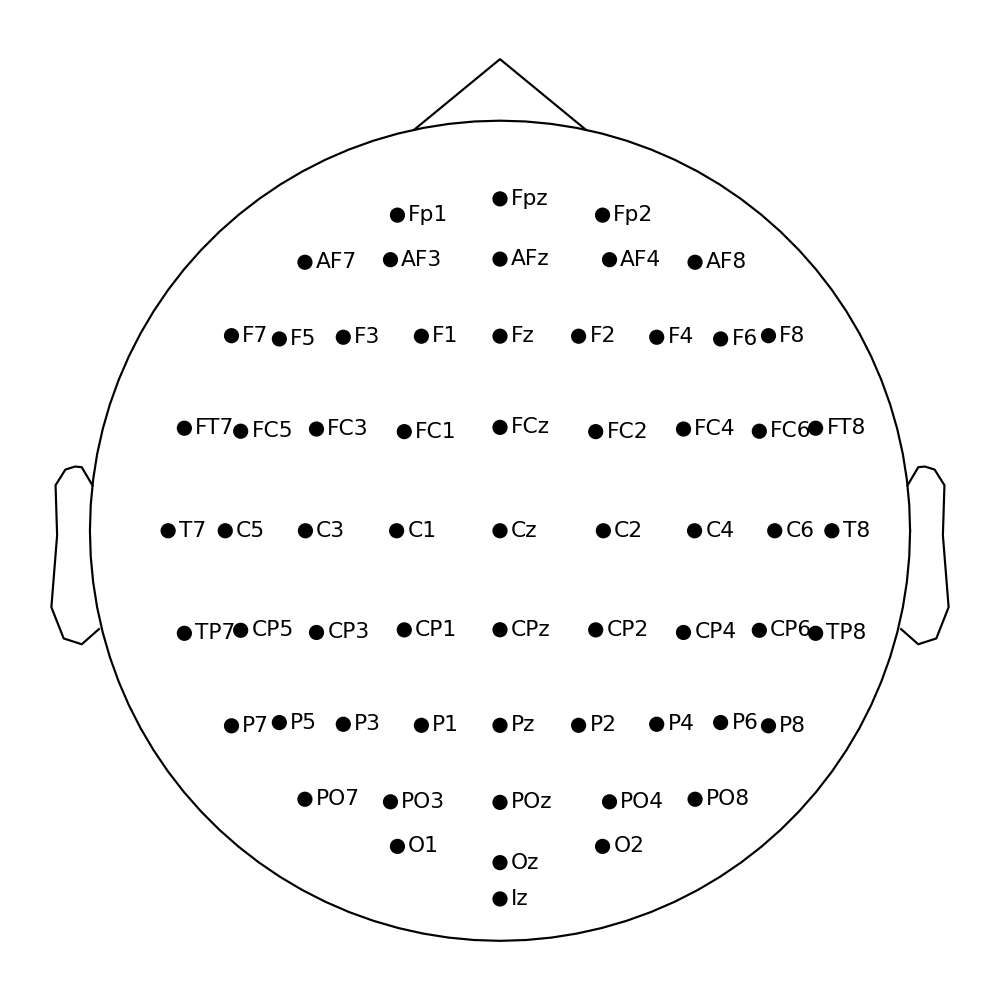

In [16]:
# YOUR CODE HERE

sample_1010.plot_sensors(show_names=True);

Effective window size : 12.800 (s)
Plotting power spectral density (dB=True).


<IPython.core.display.Javascript object>


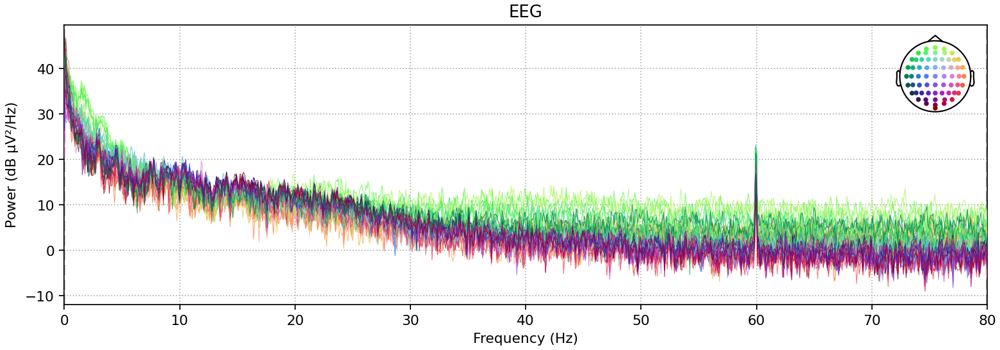

In [17]:
sample_1010.compute_psd().plot();

## 2. Preprocess the data (**1 pt**)

### 2.1 Plot EEG signals (0.25 pt) 


Using matplotlib as 2D backend.


<IPython.core.display.Javascript object>


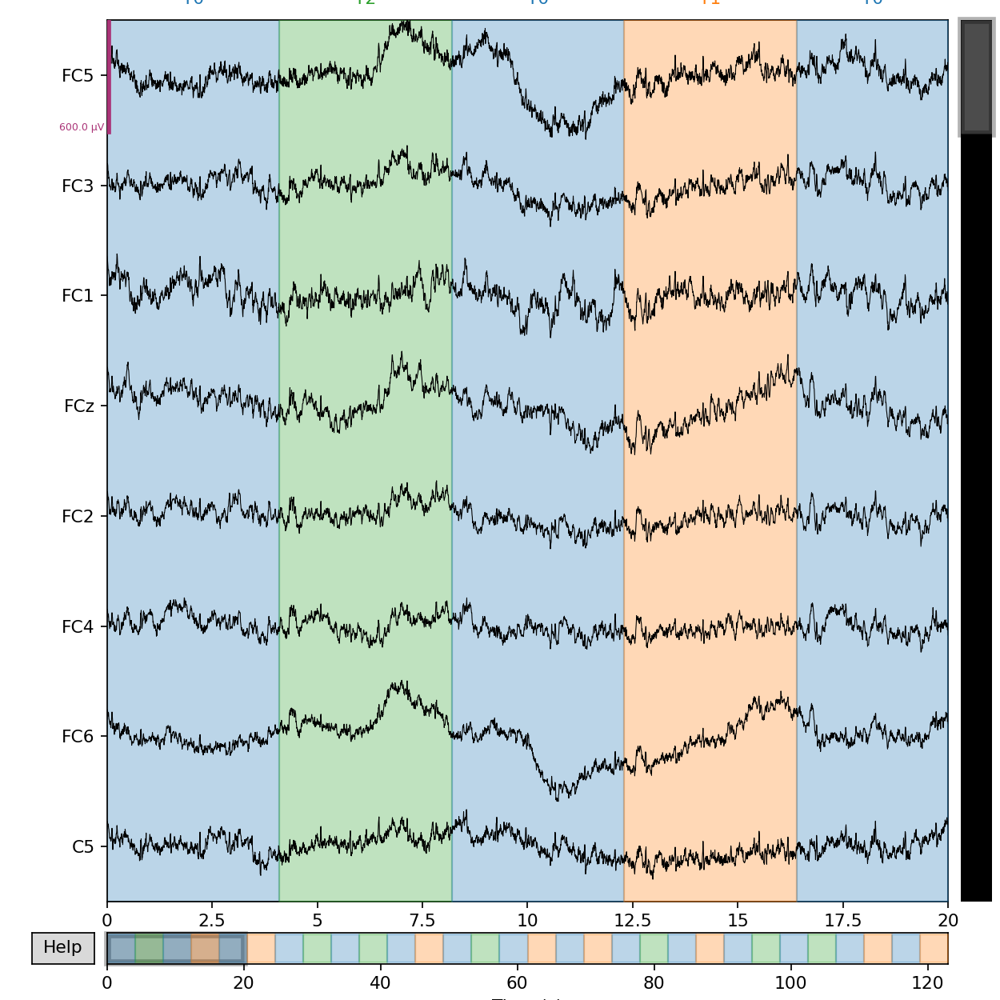

In [18]:
# YOUR CODE HERE
sample_1010.plot(n_channels=8, duration=20, scalings=3e-4);

### 2.2 Remove low-freq components < 1 Hz and high-freq > 50Hz (0.5 pt)
Use IIR filter

In [19]:
# YOUR CODE HERE
sample_1010.filter(l_freq=1, h_freq=50, method='iir');

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 1.00, 50.00 Hz: -6.02, -6.02 dB



### 2.3 Plot EEG signals and PSD after filtering (0.25 pt)

<IPython.core.display.Javascript object>


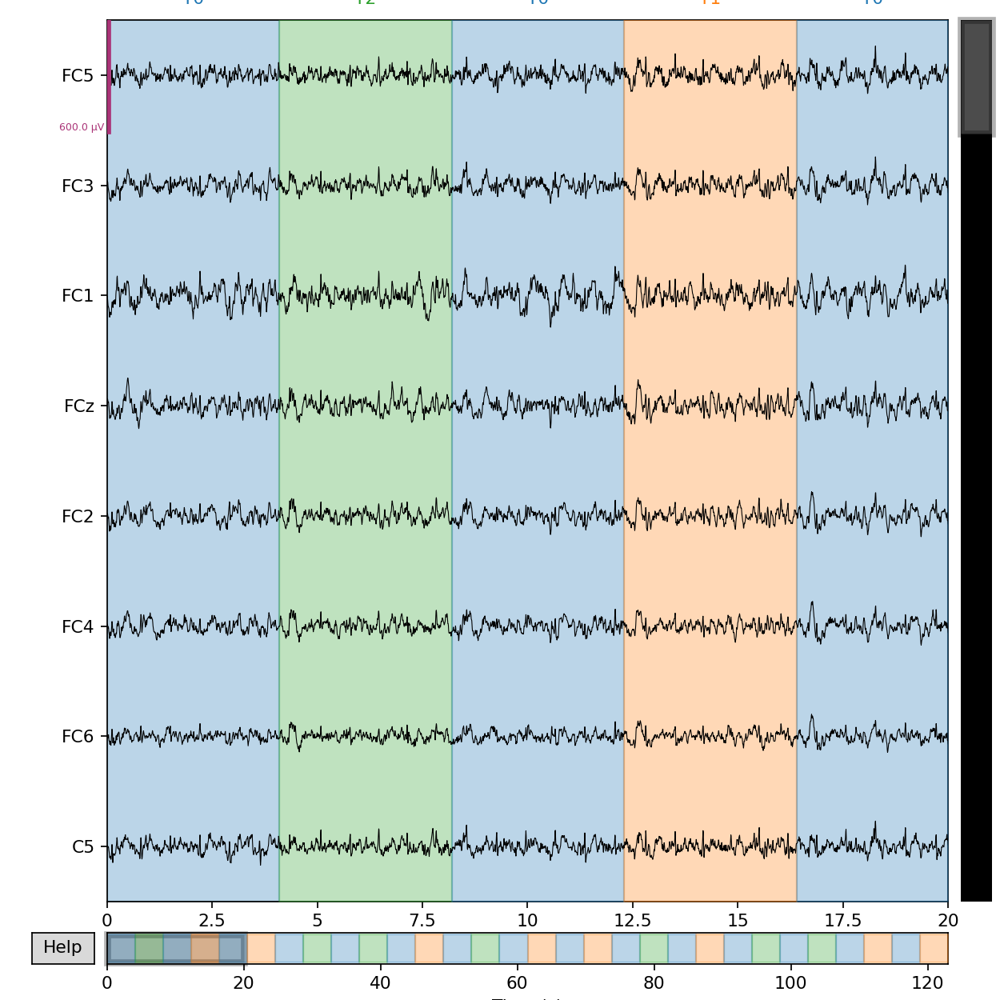

In [20]:
# YOUR CODE HERE
sample_1010.plot(n_channels=8, duration=20, scalings=3e-4);

## 3. Use ICA for noise reduction (**2 pt**)

### 3.1 Fit the ICA (0.75 pt)

Choose the number of the components in `mne.preprocessing.ICA` and fit ICA on filtered data such that explained variance `ica.get_explained_variance_ratio` is more than 90%. 

In [21]:
# YOUR CODE HERE
ica = mne.preprocessing.ICA(n_components=25, random_state=42);
ica.fit(sample_1010)

Fitting ICA to data using 62 channels (please be patient, this may take a while)
Selecting by number: 25 components
Fitting ICA took 19.2s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,1000 iterations on raw data (19680 samples)
ICA components,25
Available PCA components,62
Channel types,eeg
ICA components marked for exclusion,—


In [22]:
explained_var_ratio = ica.get_explained_variance_ratio(sample_1010)
for channel_type, ratio in explained_var_ratio.items():
    print(f"Fraction of {channel_type} variance explained by all components: {ratio}")

Fraction of eeg variance explained by all components: 0.900574170303856


### 3.2 Choose artefacts (0.75 pt)

Analyze the ICA decomposition using different visualization tools. Choose 2 to 4 components as artefacts and explain your choice.

Creating RawArray with float64 data, n_channels=25, n_times=19680
    Range : 0 ... 19679 =      0.000 ...   122.994 secs
Ready.


<IPython.core.display.Javascript object>


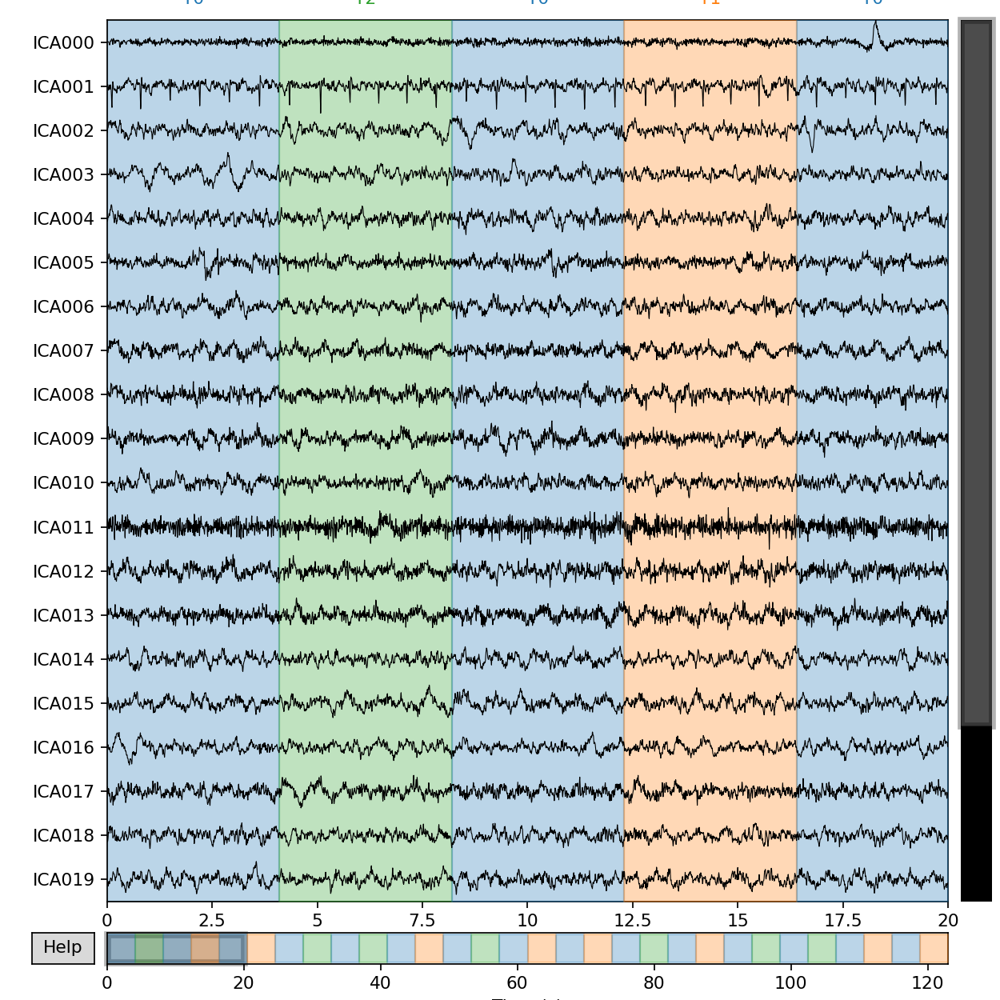

In [23]:
# YOUR CODE HERE
ica.plot_sources(sample_1010);

<IPython.core.display.Javascript object>


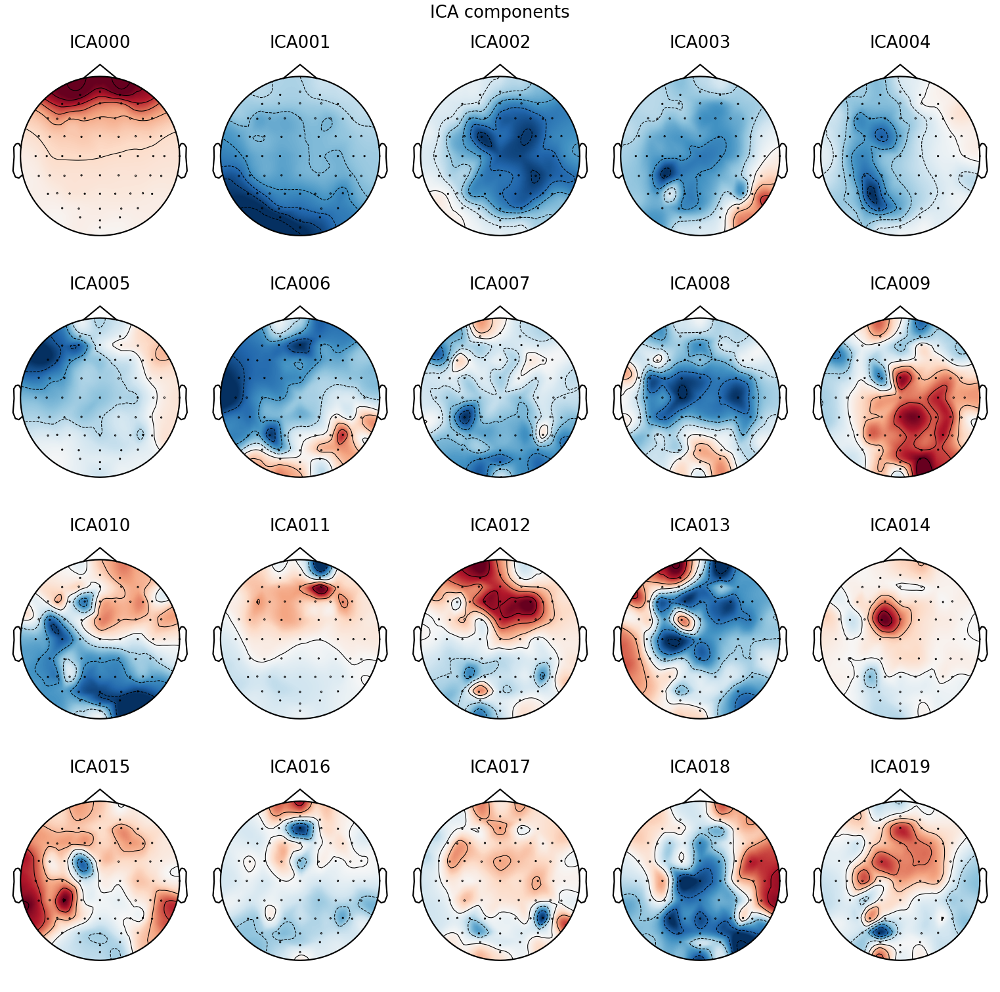

<IPython.core.display.Javascript object>


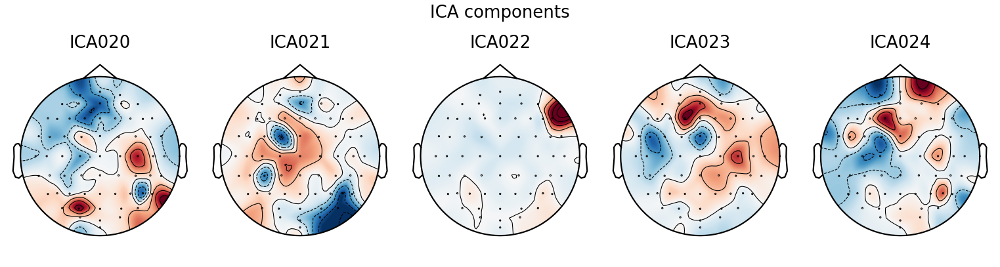

In [24]:
ica.plot_components();

<IPython.core.display.Javascript object>


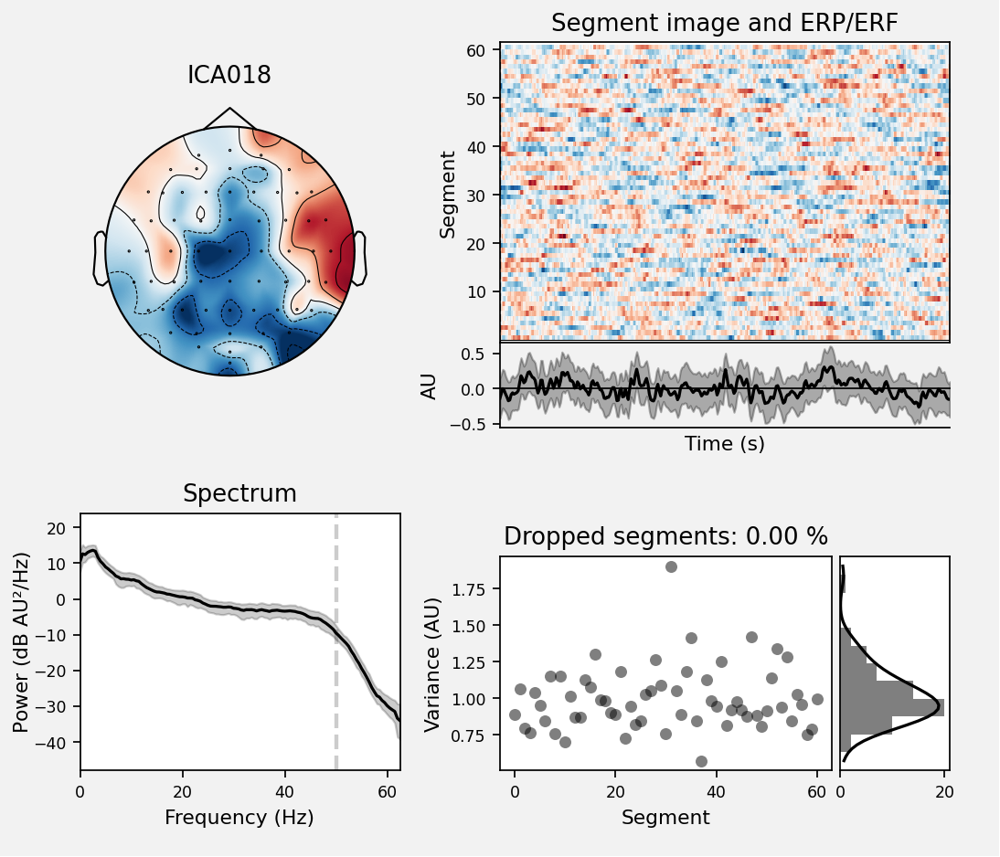

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
61 matching events found
No baseline correction applied
0 projection items activated


In [25]:
ica.plot_properties(sample_1010, picks=[18]);

ICA000 - eye blinks

ICA001 - heartbeat

**Your explanation here:**

### 3.3 Exclude artefacts and plot the results (0.5 pt)

Plot the overlay with chosen components. Exclude chosen artefacts and plot resulting signals and PSD.  

Applying ICA to Raw instance
    Transforming to ICA space (25 components)
    Zeroing out 2 ICA components
    Projecting back using 62 PCA components


<IPython.core.display.Javascript object>


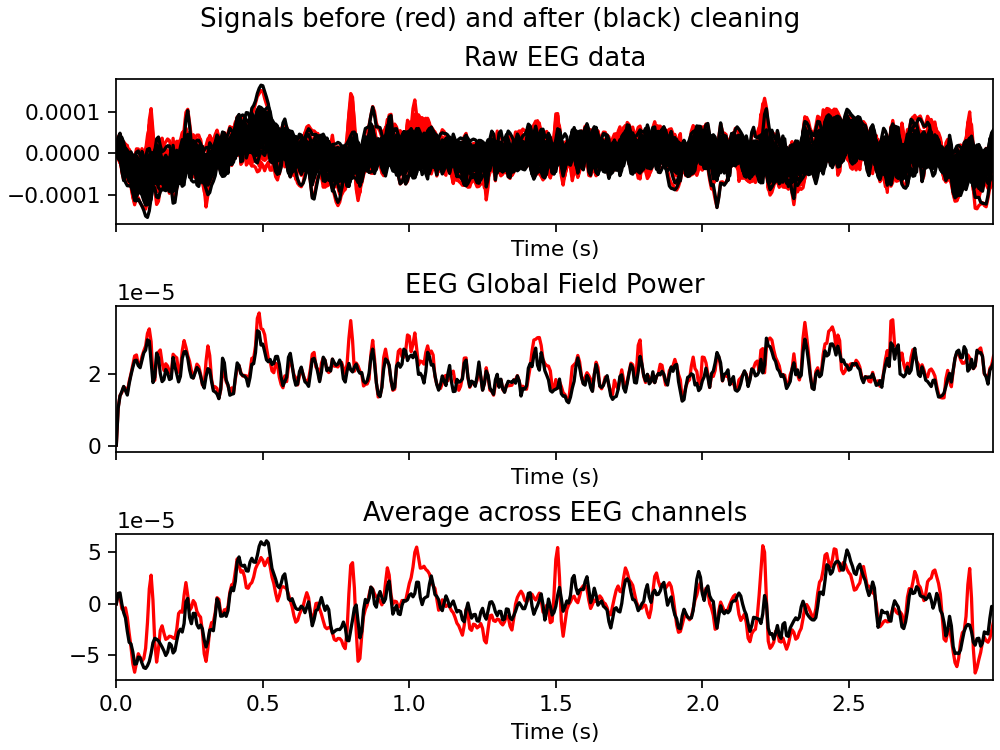

In [26]:
# YOUR CODE HERE
ica.plot_overlay(sample_1010, exclude=[0, 1]);

In [27]:
ica.exclude = [0, 1]
sample_1010_clr = sample_1010.copy()
ica.apply(sample_1010_clr);

Applying ICA to Raw instance
    Transforming to ICA space (25 components)
    Zeroing out 2 ICA components
    Projecting back using 62 PCA components


<IPython.core.display.Javascript object>


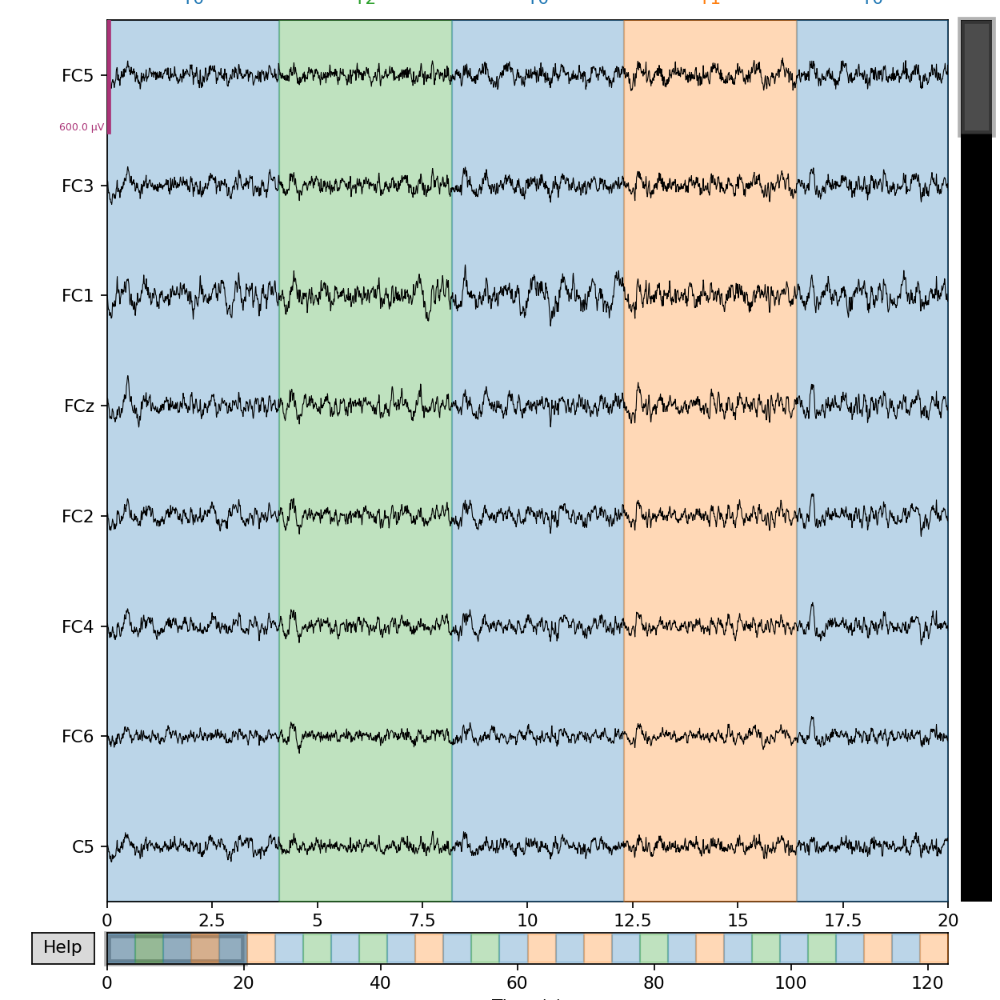

In [28]:
sample_1010_clr.plot(n_channels=8, duration=20, scalings=3e-4);

## 4. Compute ERP, plot topomaps for ERP, and analyze (2 pt)

### 4.1 Extract events from annotation and create Epoch object (0.5 pt)

Extract events using `events_from_annotations`. Create Epoch object changing values `tmin=-0.5` and `tmax=0.8` (the time relative to each event at which to start and end each epoch). Count the number of events. 

In [29]:
# YOUR CODE HERE
events, events_dict = mne.events_from_annotations(sample_1010)
epochs = mne.Epochs(sample_1010_clr, events,  tmin=-0.5, tmax=0.8, reject={'eeg': 600e-6}, preload=True, baseline=(-.1, 0))

Used Annotations descriptions: ['T0', 'T1', 'T2']
Not setting metadata
30 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 30 events and 209 original time points ...
1 bad epochs dropped


In [30]:
pd.DataFrame(epochs.events, columns=['_', '__', 'event_id'])['event_id'].value_counts()

event_id
1    14
2     8
3     7
Name: count, dtype: int64

### 4.2 Visualize Epoch object (0.25 pt)

Plot PSD and signals

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Plotting power spectral density (dB=True).
Averaging across epochs...


<IPython.core.display.Javascript object>


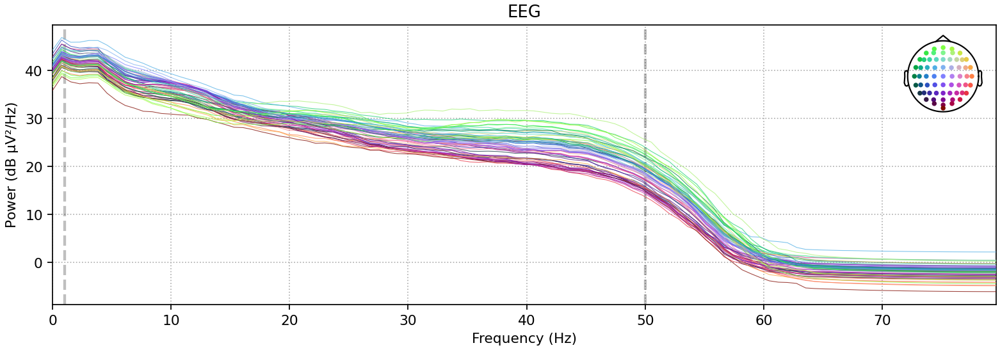

In [31]:
# YOUR CODE HERE
epochs.plot_psd();

<IPython.core.display.Javascript object>


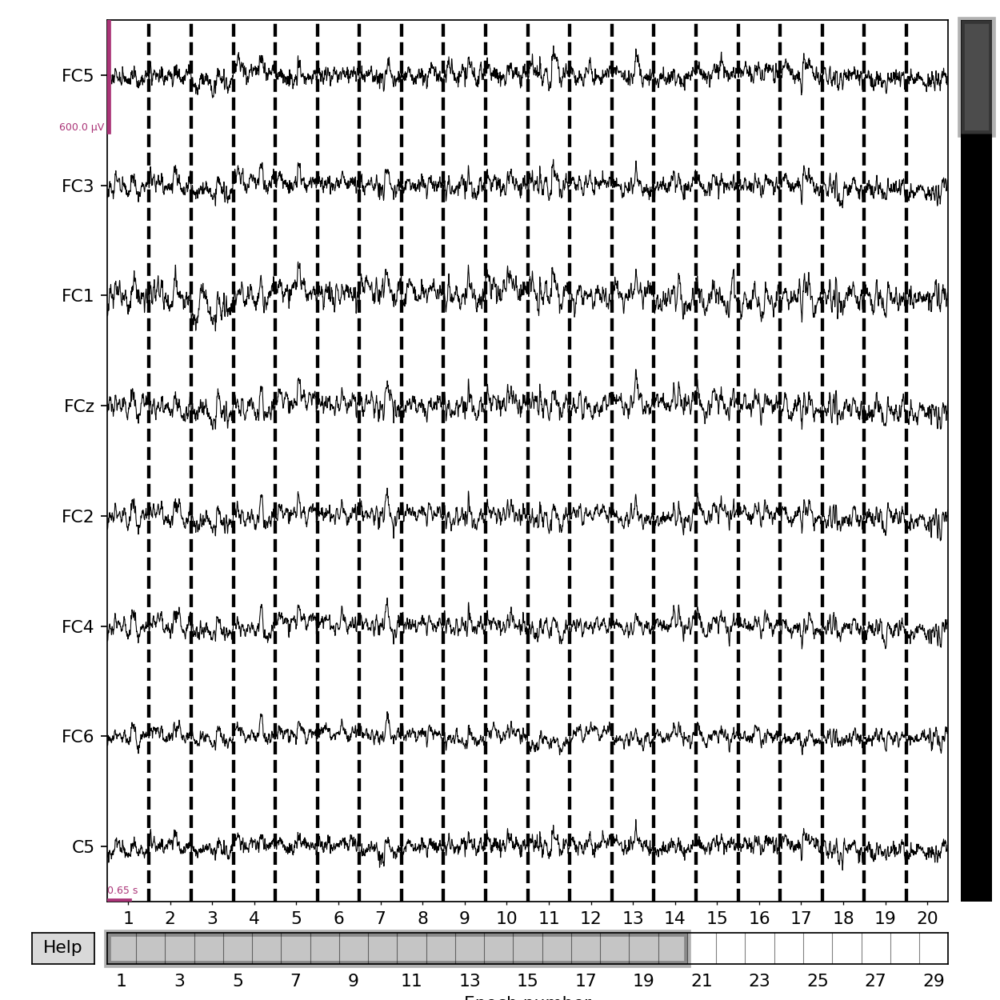

In [32]:
epochs.plot(n_channels=8, scalings={'eeg':3e-4});

### 4.3 Compute ERP (Evoked) and visualize (0.5 pt)

Compute ERP (Evoked) for each event. Visualize using `plot_joint` and `plot_topomap` for each event.

In [33]:
# YOUR CODE HERE
evoked_T0 = epochs['1'].average()
evoked_T1 = epochs['2'].average()
evoked_T2 = epochs['3'].average()

No projector specified for this dataset. Please consider the method self.add_proj.


<IPython.core.display.Javascript object>


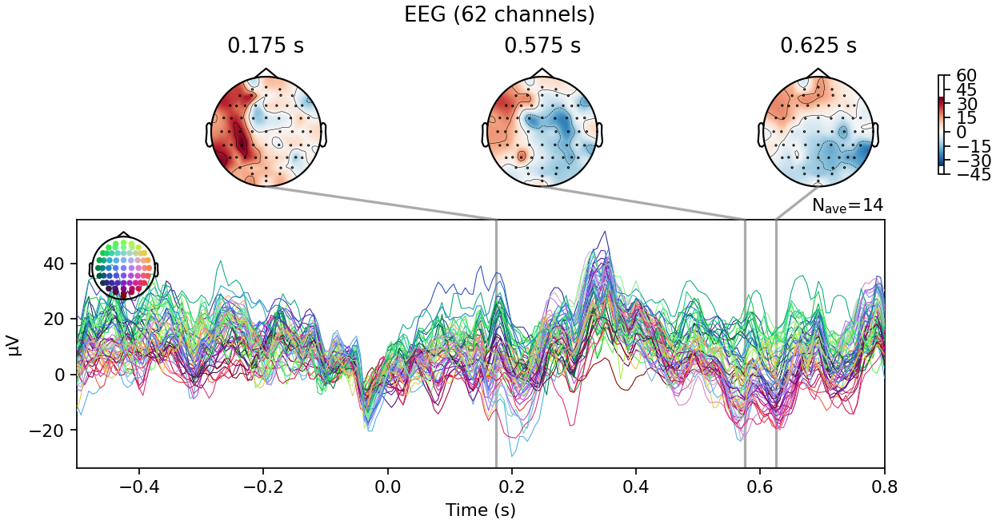

<IPython.core.display.Javascript object>


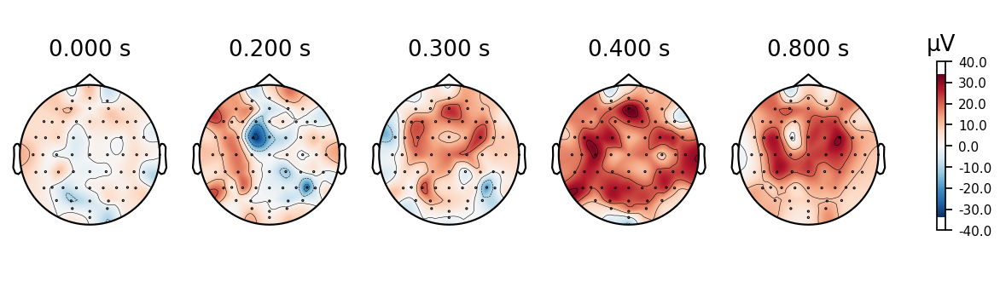

In [34]:
evoked_T0.plot_joint()
evoked_T0.plot_topomap(times=[0.0, 0.2, 0.3, 0.4, 0.8]);

No projector specified for this dataset. Please consider the method self.add_proj.


<IPython.core.display.Javascript object>


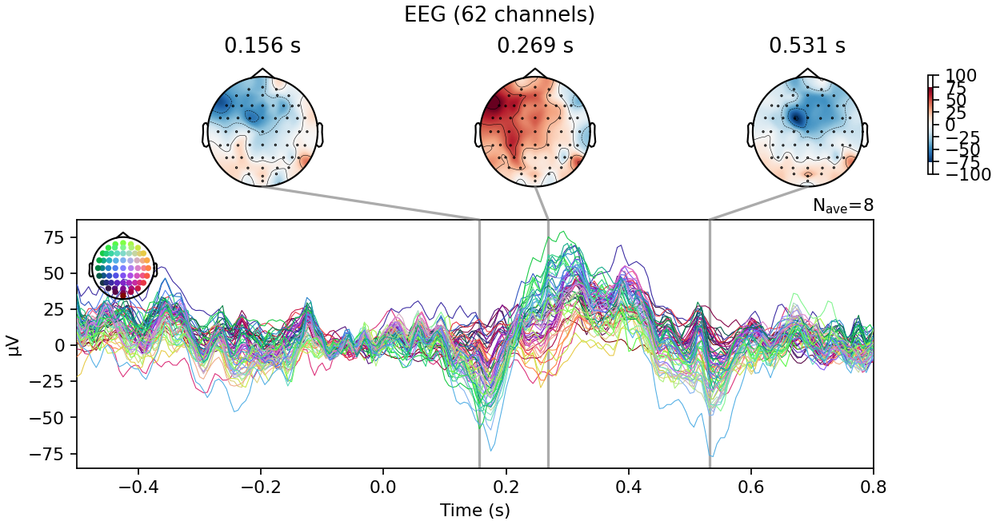

<IPython.core.display.Javascript object>


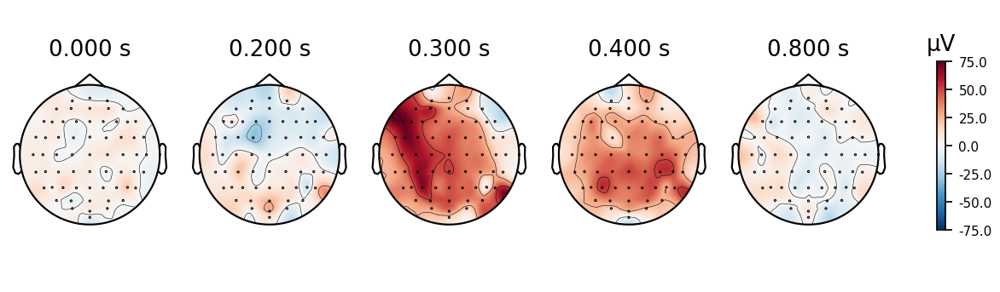

In [35]:
evoked_T1.plot_joint()
evoked_T1.plot_topomap(times=[0.0, 0.2, 0.3, 0.4, 0.8]);

No projector specified for this dataset. Please consider the method self.add_proj.


<IPython.core.display.Javascript object>


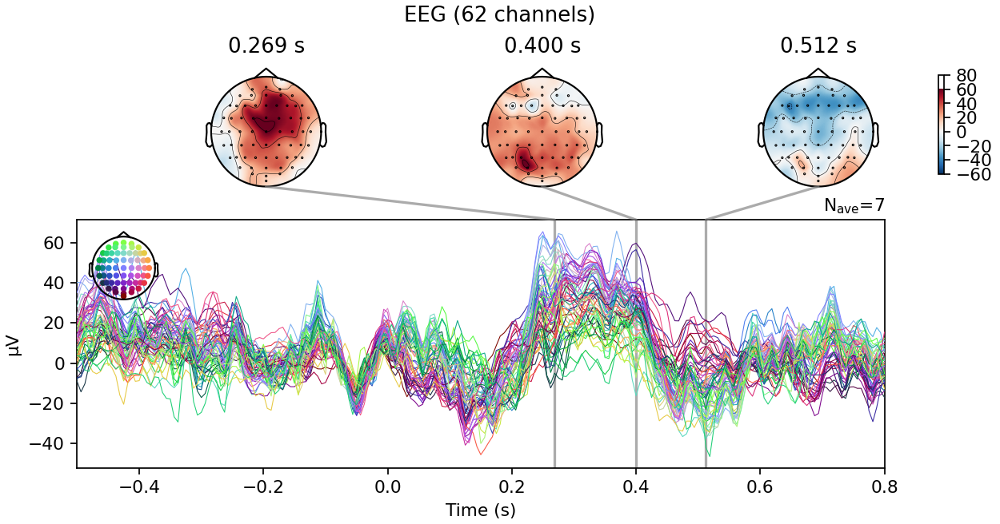

<IPython.core.display.Javascript object>


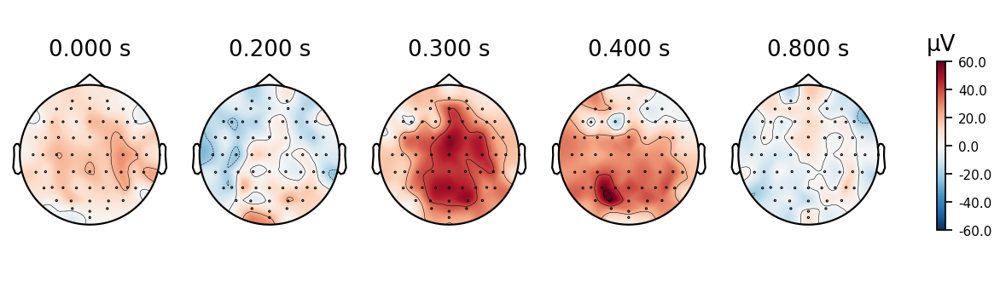

In [36]:
evoked_T2.plot_joint()
evoked_T2.plot_topomap(times=[0.0, 0.2, 0.3, 0.4, 0.8]);

### 4.4 Visualize Global Field Power (0.25 pt)

Visualize Global Field Power using `plot_compare_evokeds`.

<IPython.core.display.Javascript object>


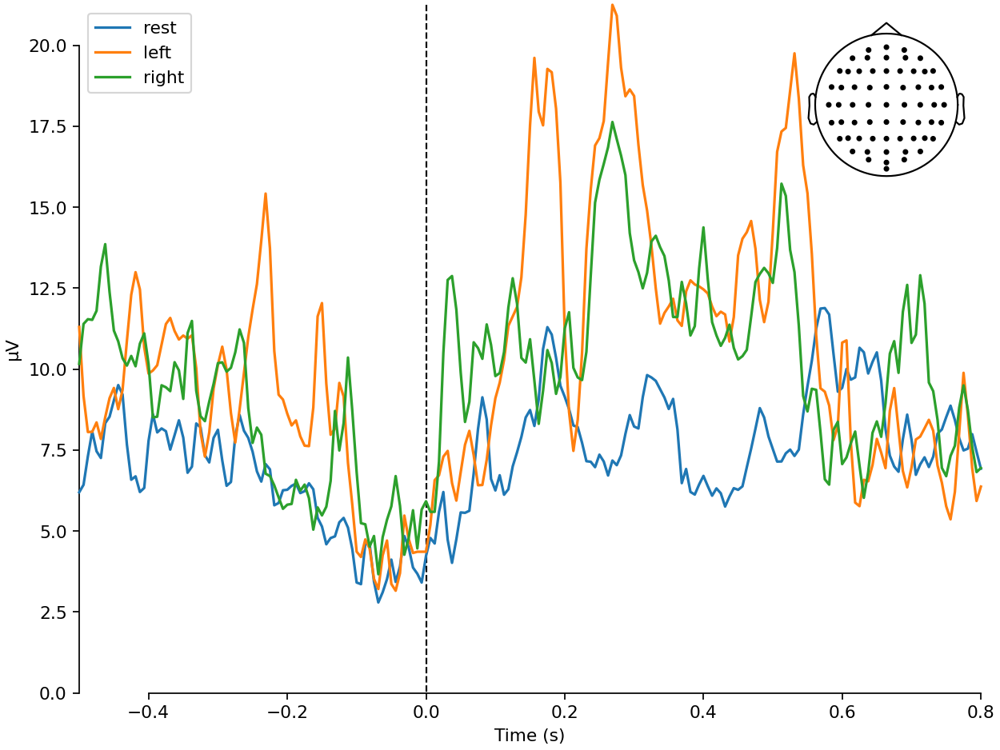

combining channels using GFP (eeg channels)
combining channels using GFP (eeg channels)
combining channels using GFP (eeg channels)


In [37]:
# YOUR CODE HERE
mne.viz.plot_compare_evokeds(
    dict(rest=evoked_T0, left=evoked_T1, right=evoked_T2),
    legend="upper left",
    show_sensors="upper right",
);

### 4.5 Write the analysis of obtained results (0.5 pt)

Analyze and interpret the generated plots.

**Your text here**